This is a simple notebook to do PCA on SDSS spectra and galaxy images.

It accompanies Chapter 7 of the book (2 of 4).

Author: Viviana Acquaviva

In [1]:
import numpy as np
import pandas as pd
import os
import random
import matplotlib.pyplot as plt

from sklearn import preprocessing, decomposition
%matplotlib inline

import skimage
from skimage.transform import resize, rescale
from skimage import io

C:\Users\jakep\PycharmProjects\ml-physics-notebooks\venv\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\jakep\PycharmProjects\ml-physics-notebooks\venv\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\jakep\PycharmProjects\ml-physics-notebooks\venv\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


### Dimensionality Reduction

Principal Component Analysis (PCA) and similar algorithms are used for dimensionality reduction in data-intensive sciences. 

The main goal of linear PCA is to find the most representative linear combinations of features, so that each element of a data set can be expressed as the superposition (sum) of some salient vectors in feature space (they don't need to be elements of a data set. In the simplest linear PCA, the principal components are the eigenvectors of the covariance matrix of the data set.

If the number of components is very low (e.g. 2 or 3, PCA or other Dimensionality Reduction methods allow one to visualize a high-dimensional data set as a 2D or 3D plot. Scikit-learn has methods to compute PCA and several variants. Classic PCA has tough complexity: $\mathcal{O}[N^3].$ 

### Let's look at an example with galaxy spectra from 

https://ogrisel.github.io/scikit-learn.org/sklearn-tutorial/tutorial/astronomy/dimensionality_reduction.html#sdss-spectral-data

In [2]:
data = np.load('../data/spec4000_corrected.npz')

In [3]:
wavelengths = data['wavelengths']
X = data['X']
y = data['y']
labels = data['labels'].astype('str')

In [4]:
X.shape

(4000, 1000)

In [5]:
y

array([4, 3, 3, ..., 4, 2, 4])

In [6]:
labels #we don't really care about these

array(['unknown', 'star', 'absorption galaxy', 'galaxy',
       'emission galaxy', 'narrow-line QSO', 'broad-line QSO', 'sky',
       'Hi-z QSO', 'Late-type star'], dtype='<U17')

### We can plot some representative examples from each class, just to have a sense of what kind of spectra are in the data set.


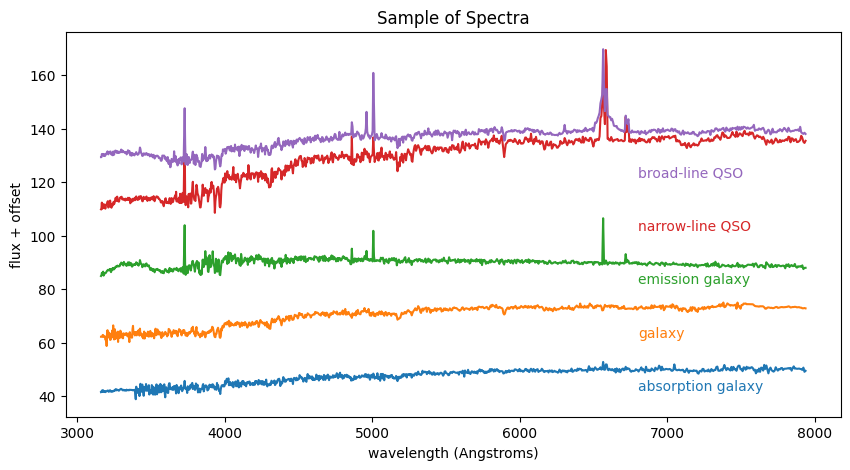

In [7]:
plt.figure(figsize=(10,5))

for i_class in (2, 3, 4, 5, 6):
    i = np.where(y == i_class)[0][0]
    l = plt.plot(wavelengths, X[i] + 20 * i_class)
    c = l[0].get_color()
    plt.text(6800, 2 + 20 * i_class, labels[i_class], color=c)

plt.subplots_adjust(hspace=0)
plt.xlabel('wavelength (Angstroms)')
plt.ylabel('flux + offset')
plt.title('Sample of Spectra');

### Our original data set has 4,000 objects and 1,000 features. 

We will try to represent it with a variable amount of components.

In [8]:
#  Perform PCA

scaler = preprocessing.StandardScaler() #It's important that data are centered!

Xn = scaler.fit_transform(X) #This is a standardization procedure.

pca_50 = decomposition.PCA(n_components=50, random_state=0)

pca_100 = decomposition.PCA(n_components=100, random_state=0)

pca_1000 = decomposition.PCA(n_components=1000, random_state=0)

X_proj_50 = pca_50.fit_transform(Xn) #the projected data set - it lives in a new feature space with 4,000 objects and 50 features

X_proj_100 = pca_100.fit_transform(Xn) #the projected data set - it lives in a new feature space with 4,000 objects and 100 features

X_proj_1000 = pca_1000.fit_transform(Xn) #the projected data set - it lives in a new feature space with 4,000 objects and 1000 features


Question: Was the process above redundant?

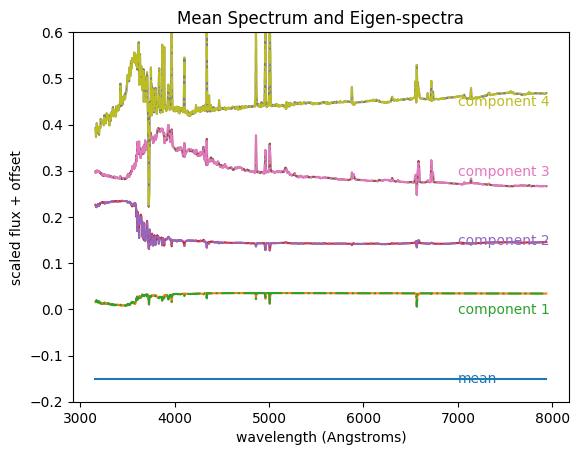

In [9]:
#----------------------------------------------------------------------
#
#  plot PCA eigenspectra
#

plt.figure()

l = plt.plot(wavelengths, pca_50.mean_ - 0.15)
c = l[0].get_color()
plt.text(7000, -0.16, "mean", color=c) 

# In linear PCA, the first eigenvector is always the mean, 
# and the first n components are always the same

for i in range(4):
    
    l = plt.plot(wavelengths, pca_50.components_[i] + 0.15 * i)
    
    l = plt.plot(wavelengths, pca_100.components_[i] + 0.15 * i, linestyle = '-.')
    
    c = l[0].get_color()
    
    plt.text(7000, -0.01 + 0.15 * i, "component %i" % (i + 1), color=c)

    plt.ylim(-0.2, 0.6)
    
plt.xlabel('wavelength (Angstroms)')
plt.ylabel('scaled flux + offset')
plt.title('Mean Spectrum and Eigen-spectra')

plt.show()


We can estimate the contribution of each component by using the property "explained variance ratio".

These are simply the eigenvalues of the covariance matrix. Their cumulative sum gives the (progressively increasing) explained variance ratio.

In [10]:
pca_50.explained_variance_ratio_ 

array([7.9755127e-01, 1.2961754e-01, 5.3842012e-02, 6.6346414e-03,
       3.5946867e-03, 2.3253574e-03, 9.7733736e-04, 7.9977553e-04,
       4.9680070e-04, 3.5665359e-04, 1.7710894e-04, 1.4121537e-04,
       6.2217514e-05, 5.5400182e-05, 4.3599870e-05, 4.2728272e-05,
       3.6682773e-05, 3.2561464e-05, 3.1908479e-05, 3.1001153e-05,
       3.0441211e-05, 2.8914579e-05, 2.8294598e-05, 2.8026278e-05,
       2.7191945e-05, 2.6667916e-05, 2.6361255e-05, 2.6072968e-05,
       2.5879010e-05, 2.5473801e-05, 2.5212514e-05, 2.4990797e-05,
       2.4507630e-05, 2.4149960e-05, 2.3761366e-05, 2.3514267e-05,
       2.3272019e-05, 2.2923761e-05, 2.2635404e-05, 2.2378828e-05,
       2.2265567e-05, 2.2085182e-05, 2.1866073e-05, 2.1448073e-05,
       2.1196860e-05, 2.0956304e-05, 2.0887965e-05, 2.0600390e-05,
       2.0530666e-05, 2.0121710e-05], dtype=float32)

In [11]:
pca_1000.explained_variance_ratio_[-10:]

array([2.1257196e-07, 2.1132624e-07, 2.1078635e-07, 2.0723080e-07,
       2.0561858e-07, 2.0204983e-07, 2.0025094e-07, 1.9823943e-07,
       1.9419234e-07, 1.8204716e-07], dtype=float32)

We can interpret the eigenvectors as the "basis" that explains most of the variability in the data. 

How can we know if this works? Let's reverse-engineer the process:

In [12]:
Xrec_50 = pca_50.inverse_transform(X_proj_50) 

Xrec_100 = pca_100.inverse_transform(X_proj_100)

Xrec_1000 = pca_1000.inverse_transform(X_proj_1000)

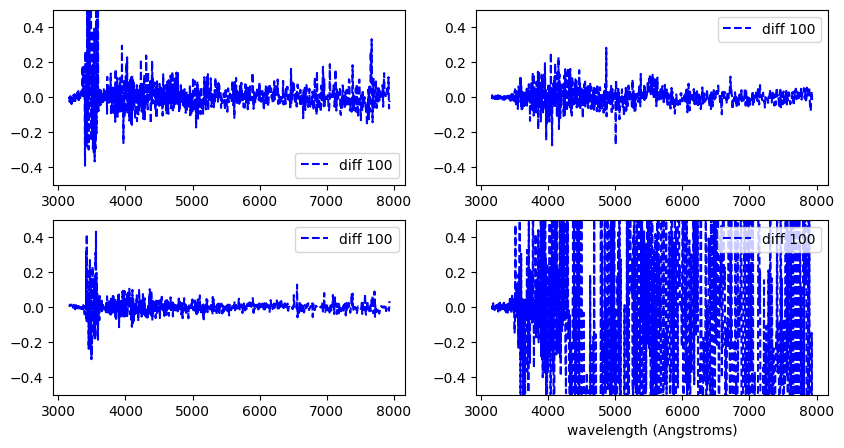

In [13]:
plt.figure(figsize=(10,5))

for i in range(4,8):
    plt.subplot(2,2,i-3)
    #plt.plot(wavelengths, Xn[i], label = 'orig', c = 'k')
    #plt.plot(wavelengths, Xrec_50[i], '--', label = 'new, 50 PCs', c = 'g')
    #plt.plot(wavelengths, Xrec_100[i], '--', label = 'new, 100 PCs', c = 'b')
    #plt.plot(wavelengths, Xrec_1000[i], '--', label = 'new, 1000 PCs', c = 'r')
    #plt.plot(wavelengths, (Xrec_50[i]-Xn[i])/Xn[i], '--', label = '% diff 50', c = 'g')
    plt.plot(wavelengths, (Xrec_100[i]-Xn[i])/Xn[i], '--', label = 'diff 100', c = 'b')
    #plt.plot(wavelengths, (Xrec_1000[i]-Xn[i])/Xn[i], '-.', label = 'diff 1000', c = 'k')
    plt.ylim(-0.5,0.5)
    plt.legend();
plt.xlabel('wavelength (Angstroms)');


### Question: how can we know what's a good number of components?

To get an idea, we can plot the "explained_variance_ratio" property of the PCA decomposition. It looks a lot like the Elbow Method, but upside down; in particular, the variance explained by N components always increases with N, but there is usually a spot after which the returns tend to diminish. 

(0.0, 20.0)

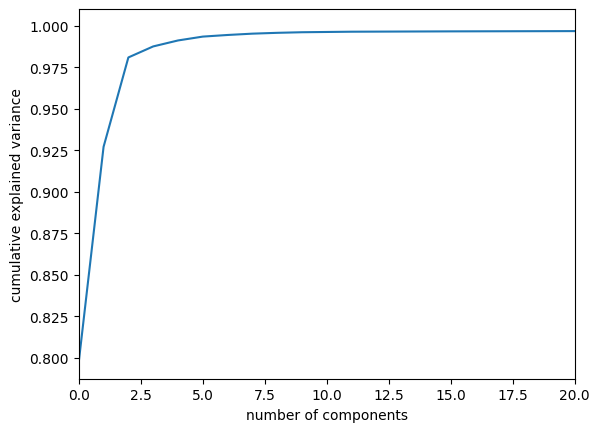

In [14]:
plt.plot(np.cumsum(pca_1000.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.xlim(0,20)

What would you recommend in the case above?

IMO, for science problems it really depends on the use! Unsupervised methods are insensitive to the science :/ Not always great. 
    
https://arxiv.org/abs/2012.00066

### Kernel PCAs example

In [15]:
pca_50 = decomposition.PCA(n_components=50, random_state=0)

In [16]:
kpca_50 = decomposition.KernelPCA(n_components=50, \
                kernel = 'rbf', gamma = 0.2, eigen_solver = 'dense', 
                                  fit_inverse_transform = True, random_state=0)

In [17]:
X_kproj_50 = kpca_50.fit_transform(Xn);

In [18]:
X_proj_50.shape

(4000, 50)

In [19]:
X_krec_50 = kpca_50.inverse_transform(X_kproj_50) #more complex transformation

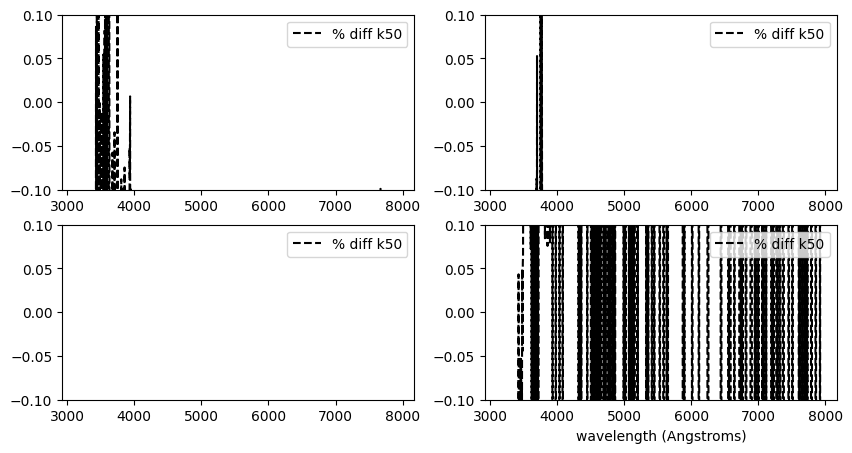

In [20]:
plt.figure(figsize=(10,5))

for i in range(4,8):
    plt.subplot(2,2,i-3)
    #plt.plot(wavelengths, Xn[i], label = 'orig', c = 'k')
    #plt.plot(wavelengths, X_krec_50[i], '--', label = 'new, 50 kPCs', c = 'g')
    plt.plot(wavelengths, (X_krec_50[i]-Xn[i])/Xn[i], '--', label = '% diff k50', c = 'k')
    plt.ylim(-0.1,0.1)
    plt.legend()
plt.xlabel('wavelength (Angstroms)');


In [21]:
X_kproj_50.shape

(4000, 50)

In [22]:
kpca_50.lambdas_ #eigenvalues - note the shift

C:\Users\jakep\PycharmProjects\ml-physics-notebooks\venv\lib\site-packages\sklearn\utils\deprecation.py:103: FutureWarning: Attribute `lambdas_` was deprecated in version 1.0 and will be removed in 1.2. Use `eigenvalues_` instead.
  warnings.warn(msg, category=FutureWarning)


array([68.3122   , 62.599808 , 45.9101   , 43.115635 , 33.68468  ,
       30.503643 , 29.479599 , 25.096802 , 23.610329 , 20.68887  ,
       20.558907 , 17.800713 , 17.050514 , 15.610471 , 14.610826 ,
       13.89288  , 13.51031  , 12.238072 , 11.896893 , 11.3533   ,
       10.607733 , 10.539998 , 10.213916 ,  9.519954 ,  9.024493 ,
        8.962622 ,  8.885715 ,  8.034701 ,  7.9983826,  7.541279 ,
        7.3891487,  7.1707373,  6.745365 ,  6.6253767,  6.454261 ,
        6.367633 ,  6.175027 ,  6.0151014,  5.795266 ,  5.675706 ,
        5.5472803,  5.3887787,  5.158245 ,  5.0070276,  4.9608765,
        4.8138266,  4.695532 ,  4.6729536,  4.5922337,  4.5383883],
      dtype=float32)

In [23]:
alphas = kpca_50.alphas_ #eigenvectors

C:\Users\jakep\PycharmProjects\ml-physics-notebooks\venv\lib\site-packages\sklearn\utils\deprecation.py:103: FutureWarning: Attribute `alphas_` was deprecated in version 1.0 and will be removed in 1.2. Use `eigenvectors_` instead.
  warnings.warn(msg, category=FutureWarning)


In [24]:
#Compare with this implementation
#From https://sebastianraschka.com/Articles/2014_kernel_pca.html

from scipy.spatial.distance import pdist, squareform
from scipy.linalg import eigh

def stepwise_kpca(X, gamma, n_components):
    """
    Implementation of a RBF kernel PCA.

    Arguments:
        X: A MxN dataset as NumPy array where the samples are stored as rows (M),
           and the attributes defined as columns (N).
        gamma: A free parameter (coefficient) for the RBF kernel.
        n_components: The number of components to be returned.

    Returns the k eigenvectors (alphas) that correspond to the k largest
        eigenvalues (lambdas).

    """
    # Calculating the squared Euclidean distances for every pair of points
    # in the MxN dimensional dataset.
    sq_dists = pdist(X, 'sqeuclidean')

    # Converting the pairwise distances into a symmetric MxM matrix.
    mat_sq_dists = squareform(sq_dists)

    # Computing the MxM kernel matrix.
    K = np.exp(-gamma * mat_sq_dists)

    # Centering the symmetric NxN kernel matrix.
    N = K.shape[0]
    one_n = np.ones((N,N)) / N
    K_norm = K - one_n.dot(K) - K.dot(one_n) + one_n.dot(K).dot(one_n)

    # Obtaining eigenvalues in descending order with corresponding
    # eigenvectors from the symmetric matrix.
    eigvals, eigvecs = eigh(K_norm)

    # Obtaining the i eigenvectors (alphas) that corresponds to the i highest eigenvalues (lambdas).
    
    alphas = np.column_stack((eigvecs[:,-i] for i in range(1,n_components+1)))
    
    lambdas = [eigvals[-i] for i in range(1,n_components+1)]

    return alphas, lambdas

### Let's now take a look at images.

This data set is composed by 200 images randomy selected from the Kaggle Galaxy Zoo challenge:

https://www.kaggle.com/c/galaxy-zoo-the-galaxy-challenge

The code below visualizes the first 25 objects in your data set. You can run it to get a view of the first 25 galaxies. Note: you might get an error message, in this case see here

https://stackoverflow.com/questions/43288550/iopub-data-rate-exceeded-in-jupyter-notebook-when-viewing-image

In [25]:
#Takes < 1 minute, let's use non-bubbled images

images = []
for i in range(200):
    img =skimage.io.imread('../data/galaxy_images/Image_'+str(i)+'.png')
    img_resized = resize(img,(100,100))
    length = np.prod(img_resized.shape)
    img_resized = np.reshape(img_resized,length)
    images.append(img_resized)
    
images = np.vstack(images)

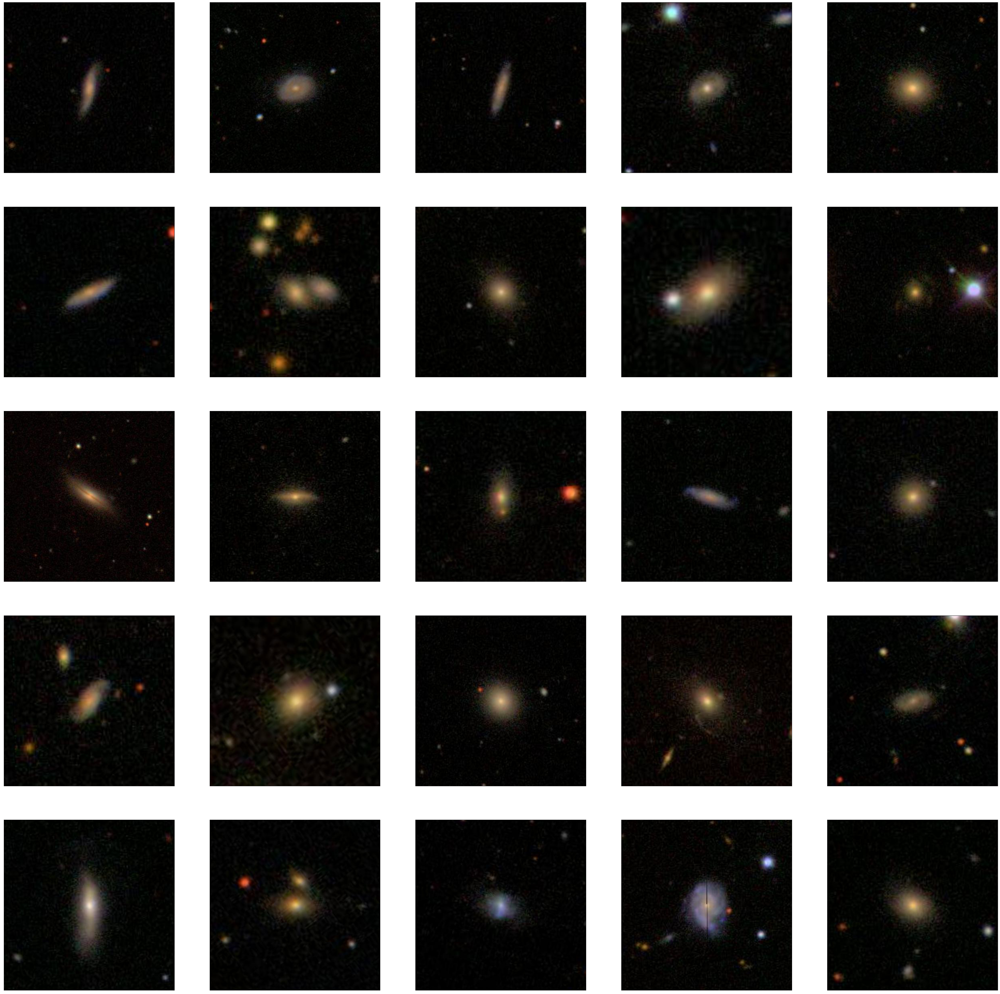

In [26]:
fig, axes = plt.subplots(ncols= 5, nrows = 5,figsize=(50,50))

ax = axes.ravel()

for i in range(ax.shape[0]):

    img = skimage.io.imread('../data/galaxy_images/Image_'+str(i)+'.png')
    ax[i].imshow(img, cmap='gray')
    ax[i].set_xticks([])
    ax[i].set_yticks([])


### Here, we do the PCA decomposition on each of the RGB channels separately. I'm not sure of whether it is optimal.

In [27]:
r_images = images.reshape(200, -1,  3)[:,:,0]

In [28]:
r_images.shape

(200, 10000)

In [29]:
#Calling PCA on images

estimator = decomposition.PCA(n_components=100)

r_images_PCA = estimator.fit_transform(r_images)

In [30]:
#This tell us about the dimensionality reduction we have achieved.

r_images_PCA.shape

(200, 100)

In [31]:
components = estimator.components_

### We can plot the first 50 components. From this plot, would you guess an optimal # of components?

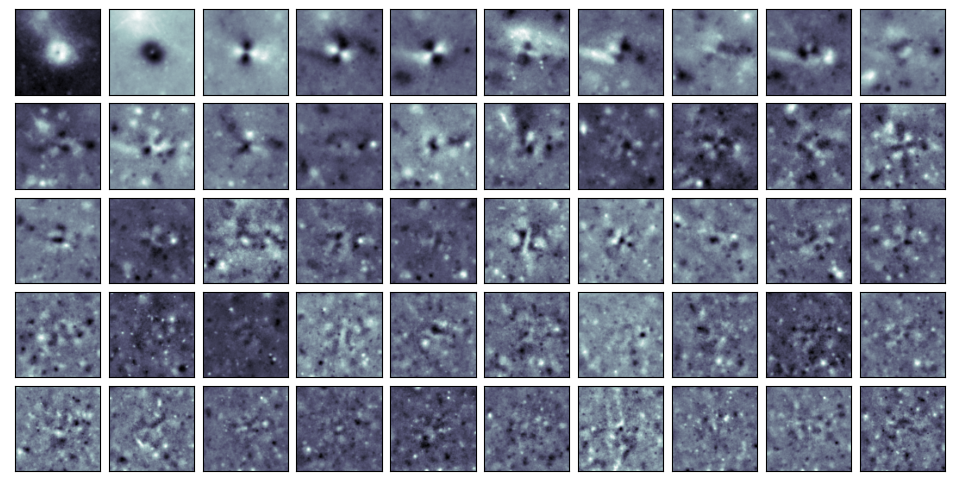

In [32]:
fig, axes = plt.subplots(5, 10, figsize=(12, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow((estimator.components_[i].reshape(100, 100)), cmap='bone')

We can use the explained variance ratio to see if there is an obvious optimal number of components.

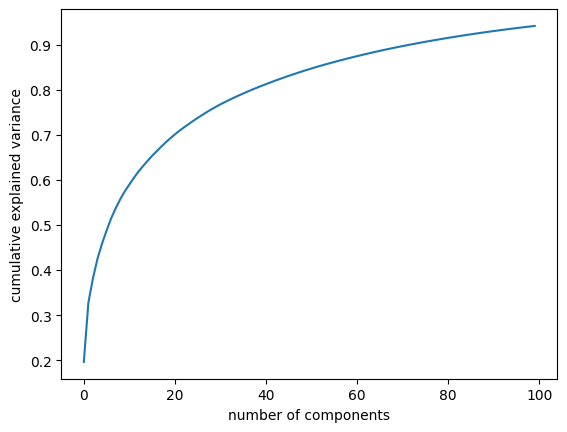

In [33]:
plt.plot(np.cumsum(estimator.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

### Conclusion: 25-30ish?

### Let's now reconstruct the original images.

In [34]:
r_projected = estimator.inverse_transform(r_images_PCA)

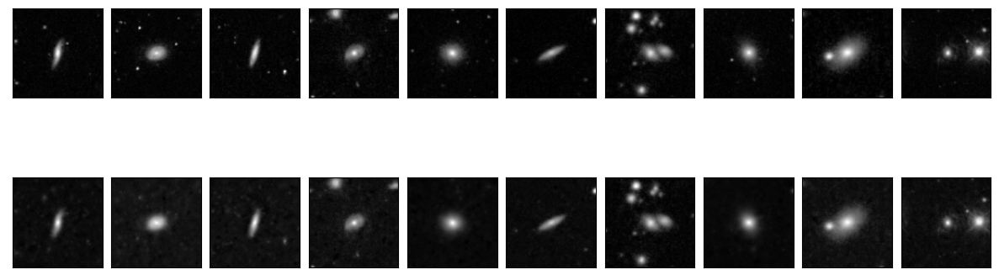

In [35]:
# Plot the results
fig, ax = plt.subplots(2, 10, figsize=(15, 5),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(10):
    ax[0, i].imshow(r_images[i].reshape(100, 100), cmap='gray')
    ax[1, i].imshow(r_projected[i].reshape(100, 100), cmap='gray')
#diff    ax[1, i].imshow((r_projected[i] - r_images[i]).reshape(100, 100), cmap='gray')

We can do it for the three channels at once and then join them together:

In [36]:
estimator = decomposition.PCA(n_components=100) 

r_images = images.reshape(200, -1,  3)[:,:,1]                     
estimator.fit(r_images)
r_images_PCA = estimator.fit_transform(r_images)
r_projected = estimator.inverse_transform(r_images_PCA)

g_images = images.reshape(200, -1,  3)[:,:,1]                     
estimator.fit(g_images)
g_images_PCA = estimator.fit_transform(g_images)
g_projected = estimator.inverse_transform(g_images_PCA)

b_images = images.reshape(200, -1,  3)[:,:,2]                     
estimator.fit(b_images)
b_images_PCA = estimator.fit_transform(b_images)
b_projected = estimator.inverse_transform(b_images_PCA)

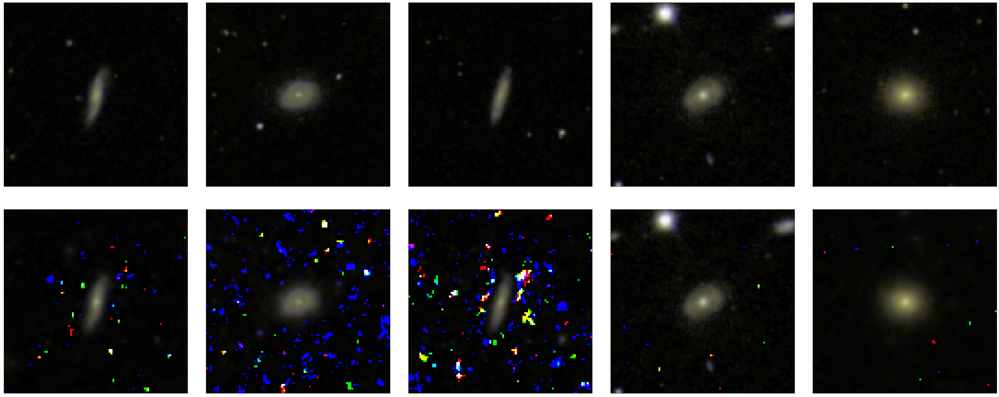

In [37]:
# Plot the results
fig, ax = plt.subplots(2, 5, figsize=(50, 20),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(5):
    ax[0, i].imshow((np.dstack([r_images[i].reshape(100, 100)*255, g_images[i].reshape(100, 100)*255, 
        b_images[i].reshape(100,100)*255]).astype(np.uint8)))
    ax[1, i].imshow((np.dstack([r_projected[i].reshape(100, 100)*255, g_projected[i].reshape(100, 100)*255, 
        b_projected[i].reshape(100,100)*255]).astype(np.uint8)))

## Conclusions

Dimensionality reduction techniques are useful both to build understanding of what's in the data and to make sizes more manageable.

Clustering and dimensionality reduction have a lot of overlap! For example in the Example # 2 of:

https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.11-K-Means.ipynb

#### Non-linear manifold techniques (t-SNE, Self Organized Maps...) are popular tools for visualization in 2D space, and they are useful for data exploration/investigation. However, they have tunable parameters that are not easy to tune, and they are hard to interpret.

#### Happy to select some references/reading material if anyone is interested.

See for example:

https://scikit-learn.org/stable/modules/manifold.html#manifold

or

https://www.superdatascience.com/blogs/the-ultimate-guide-to-self-organizing-maps-soms

